# Endogenous model shifts

In this notebook we will use toy data to see how endogenous domain shifts and the resulting model shifts can have implications on the validity and cost of algorithmic recourse.

In [25]:
using Pkg; Pkg.activate("..")

  Activating environment at `~/Documents/code/EndogenousShifts/Project.toml`


In [26]:
include("../src/load.jl")
using AlgorithmicRecourse
using CSV, DataFrames
using LinearAlgebra;
using Distributions;
using Images, FileIO;
using Plots, PlotThemes
theme(:wong)
using Logging
disable_logging(Logging.Info)
output_folder = "output/synthetic"
www_folder = "www/synthetic"
using Base.Filesystem: joinpath


## Single-period

### Training the classifier

We start by training a simple linear classifier: Bayesian Logisitic Regression.

In [27]:
df = CSV.read("../data/cats_dogs_large.csv", DataFrame);
y = df[:,:y];
N = length(y);
X = Matrix(df[:,Not(:y)]);
model = Models.bayes_logreg(X,y); # get MAP estimates
w = model.μ;

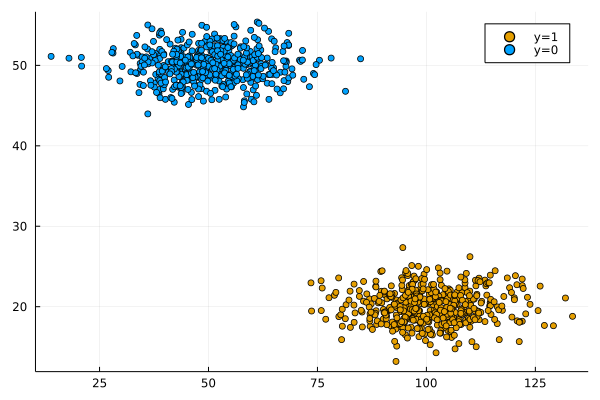

In [28]:
# Plot data points.
plt = plot()
using Main.Experiments: plot_data!
plot_data!(plt,X,y)

In [29]:
using AlgorithmicRecourse.Models: BayesianLogisticModel, LogisticModel
𝑴 = BayesianLogisticModel(reshape(model.μ,1,length(model.μ)), model.Σ) # fully Bayesian model
𝑴_plugin = LogisticModel(reshape(model.μ[2:3],1,2), [model.μ[1]]); # Plugin estimate (non-Bayesian)
models = (Bayesian=𝑴, Plugin=𝑴_plugin);

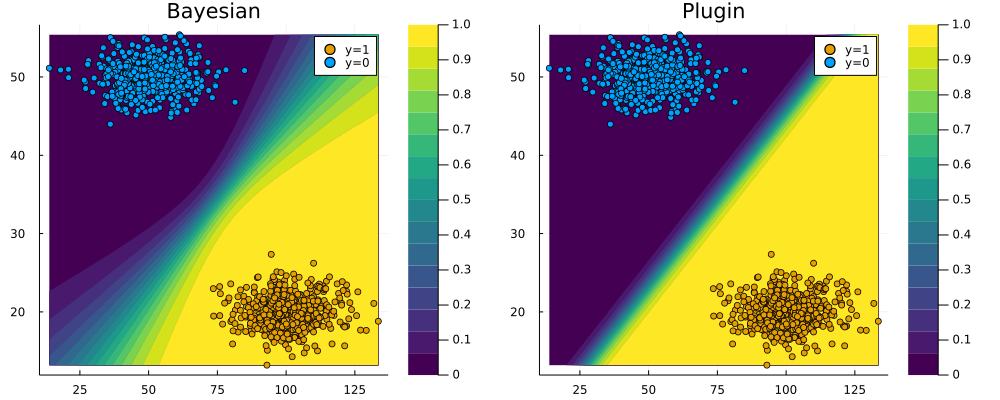

In [30]:
using Main.Experiments: plot_contour
p1 = plot_contour(X,y,𝑴,title="Bayesian")
p2 = plot_contour(X,y,𝑴_plugin,title="Plugin")
plot(p1,p2,size=(1000,400))

### Generating recourse

Now we will generate and implement algorithmic recourse for a subset of cats.

In [31]:
generators = (Bayesian=GreedyGenerator(1,500,:logitbinarycrossentropy, nothing), Plugin=GenericGenerator(0.1,0.1,1e-5,:logitbinarycrossentropy,nothing));
proportion = 0.2
using StatsBase
cats = findall(df.y.==0);
chosen_individuals = StatsBase.sample(cats,Int(round(proportion * length(cats))),replace=false);
target = 1.0
γ = 0.90;

In [32]:
function generate_counterfactuals(generator, 𝑴, target, γ, chosen_individuals; X=X, y=y)
    X̲ = copy(X)
    y̲ = copy(y)
    for i in chosen_individuals
        x̅ = X[i,:]
        recourse = generate_recourse(generator, x̅, 𝑴, target, γ);
        X̲[i,:] = recourse.x̲
        y̲[i] = recourse.y̲
    end
    return X̲, y̲
end

generate_counterfactuals (generic function with 1 method)

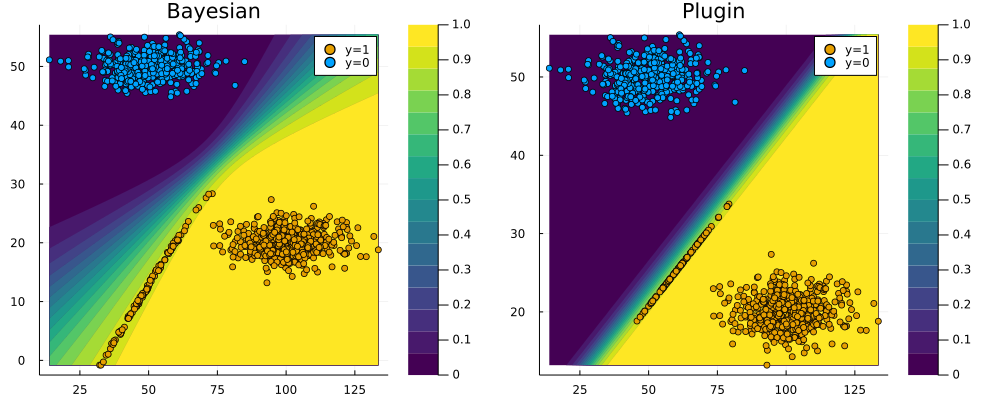

In [33]:
plt = []
for i in 1:length(generators)
    X̲, y̲ = generate_counterfactuals(generators[i], models[i], target, γ, chosen_individuals)
    pltᵢ = plot_contour(X̲,y̲,models[i],title=keys(generators)[i])
    plt = vcat(plt, pltᵢ)
end
plot(plt..., size = (1000,400))

### Retraining classifier

Finally, we will retrain the classifier (model shift) and plot the resulting new decision boundary and posterior predictive distribution.

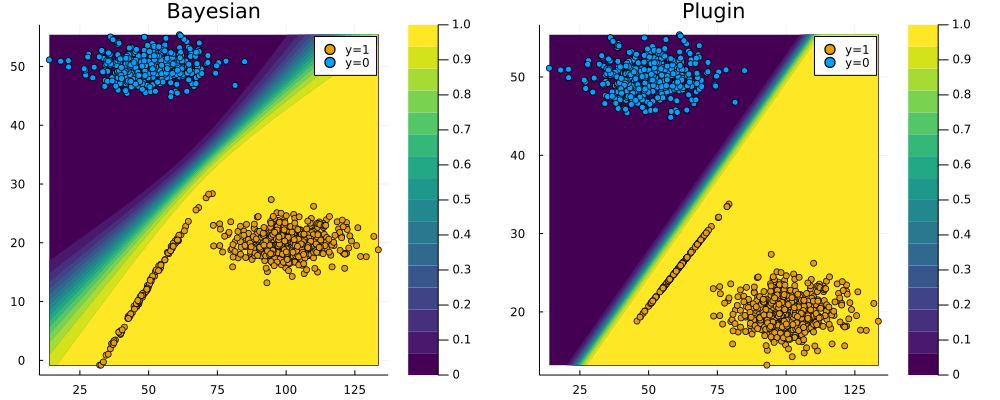

In [34]:
plt = []
for i in 1:length(generators)
    X̲, y̲ = generate_counterfactuals(generators[i], models[i], target, γ, chosen_individuals)
    data = Models.prepare_data(X̲', y̲')
    𝑴 = Models.retrain(models[i], data)
    pltᵢ = plot_contour(X̲,y̲,𝑴,title=keys(generators)[i])
    plt = vcat(plt, pltᵢ)
end
plot(plt..., size = (1000,400))

## Dynamic

In [35]:
# Variables:
μ = [0.01,0.1,0.25]
γ = [0.50,0.75,0.9]
grid_ = Experiments.GridVariables(μ, γ)
n_rounds = 10
n_folds = 5
target = 1.0
T = 1000;
# Experiments:
experiment = Experiments.Experiment(X',y',models[:Bayesian],target,grid_,n_rounds)
experiment_plugin = Experiments.Experiment(X',y',models[:Plugin],target,grid_,n_rounds)
experiments = (experiment, experiment_plugin);

In [36]:
run = false
if run
    using Random
    Random.seed!(1234)
    for j in 1:length(generators)
        outcome, path = Experiments.run_experiment(experiments[j], generators[j], n_folds, T=T, store_path=true)
        Experiments.save_path(joinpath(output_folder, string(keys(generators)[j])),path)
        CSV.write(joinpath(output_folder, string(keys(generators)[j]) * ".csv"), DataFrame(outcome))
    end
end

In [37]:
run = false
if run
    using Main.Experiments: plot_path
    paths = [Experiments.load_path(joinpath(output_folder, string(keys(generators)[j]))) for j ∈ 1:length(generators)];
    anim = Experiments.plot_path(paths[1],Γ=γ,𝙈=μ)
    gif(anim,joinpath(www_folder,"bayesian.gif"), fps=2)
    anim = Experiments.plot_path(paths[2],Γ=γ,𝙈=μ)
    gif(anim,joinpath(www_folder,"plugin.gif"), fps=2)
end

For the Bayesian classifier with greedy recourse...

![](www/synthetic/bayesian.gif)

For the non-Bayesian classifier with generic recourse...

![](www/synthetic/plugin.gif)

In [38]:
using Main.Experiments: prepare_results, plot_results
validity = DataFrame()
cost = DataFrame()
files = (Bayesian=joinpath(output_folder, "Bayesian.csv"), Plugin=joinpath(output_folder, "Plugin.csv"))
results = map(file -> CSV.read(file, DataFrame), files)
p_val, p_cost = plot_results(results);

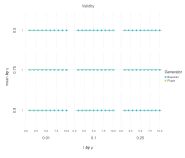

In [39]:
p_val

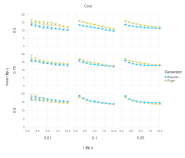

In [40]:
p_cost

## Neural network

In [41]:
using Flux
data = Models.prepare_data(X', y')
nn = Models.build_model(input_dim=size(X')[1], n_hidden=100)
loss(x, y) = Flux.Losses.logitbinarycrossentropy(nn(x), y);

Training a single neural network...

In [42]:
using BSON
run = false
opt = ADAM()
if run
  # Train model:
  using Flux.Optimise: update!, ADAM
  using Statistics, StatsBase
  epochs = 10
  avg_loss(data) = mean(map(d -> loss(d[1],d[2]), data))
  accuracy(data) = sum(map(d ->round.(Flux.σ.(nn(d[1]))) .== d[2], data))[1]/length(data)

  using Plots
  anim = Animation()
  avg_l = [avg_loss(data)]
  p1 = scatter(ylim=(0,avg_l[1]), xlim=(0,epochs), legend=false, xlab="Epoch", title="Average loss")
  acc = [accuracy(data)]
  p2 = scatter(ylim=(0.5,1), xlim=(0,epochs), legend=false, xlab="Epoch", title="Accuracy")
  
  τ = 1.1
  stopping_criterium_reached = accuracy(data) >= τ
  epoch = 1

  while epoch <= epochs && !stopping_criterium_reached
    for d in data
      gs = gradient(Flux.params(nn)) do
        l = loss(d...)
      end
      update!(opt, Flux.params(nn), gs)
    end
    avg_l = vcat(avg_l,avg_loss(data))
    plot!(p1, [0:epoch], avg_l, color=1)
    scatter!(p1, [0:epoch], avg_l, color=1)
    acc = vcat(acc,accuracy(data))
    plot!(p2, [0:epoch], acc, color=1)
    scatter!(p2, [0:epoch], acc, color=1)
    plt=plot(p1,p2, size=(600,300))
    frame(anim, plt)

    # Check if desired accuracy reached:
    stopping_criterium_reached = accuracy(data) >= τ

    epoch += 1

  end

  gif(anim, joinpath(www_folder, "single_nn.gif"), fps=10)

  BSON.@save joinpath(output_folder, "nn.bson") nn

end

LoadError: LoadError: UndefVarError: BSON not defined
in expression starting at /Users/FA31DU/Documents/code/EndogenousShifts/work/synthetic_endogenous_shifts.ipynb:48

In [43]:
using BSON: @load
@load joinpath(output_folder, "nn.bson") nn
𝑴ₙₙ = Models.FittedNeuralNet(nn, opt, loss);

Training a deep ensemble...

In [44]:
opt = ADAM()
loss_type = :logitbinarycrossentropy
run = false
if run
    K = 50
    𝓜 = Models.build_ensemble(K,kw=(input_dim=size(X')[1], n_hidden=100));
    𝓜, anim = Models.forward(𝓜, data, opt, n_epochs=10, plot_every=10, loss_type=loss_type, τ=1.1); # fit the ensemble
    Models.save_ensemble(𝓜, root=joinpath(output_folder, "ensemble")) # save to disk
    gif(anim, joinpath(www_folder, "ensemble_loss.gif"), fps=25);
end

In [45]:
𝓜 = Models.load_ensemble(root=joinpath(output_folder, "ensemble"))
𝑴 = Models.FittedEnsemble(𝓜, opt, loss_type)
models = (Bayesian=𝑴, Plugin=𝑴ₙₙ);

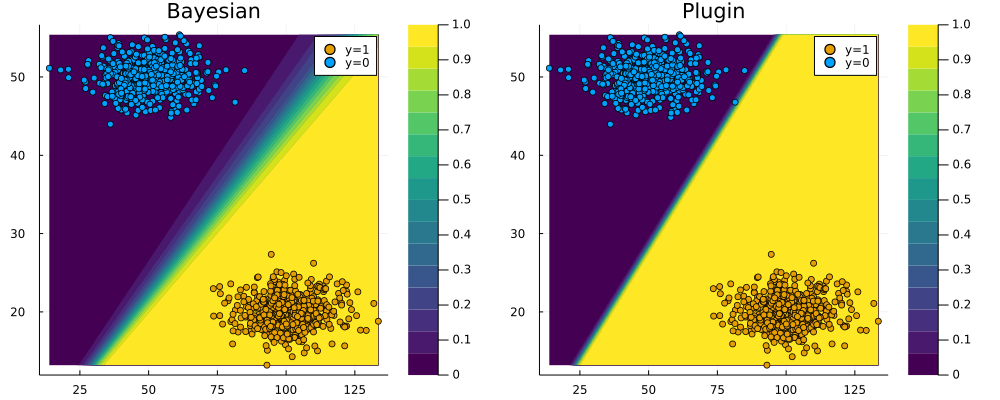

In [46]:
using Main.Experiments: plot_contour
p1 = plot_contour(X,y,models[1],title="Bayesian")
p2 = plot_contour(X,y,models[2],title="Plugin")
plot(p1,p2,size=(1000,400))

In [47]:
# Experiments:
experiment = Experiments.Experiment(X',y',models[:Bayesian],target,grid_,n_rounds)
experiment_plugin = Experiments.Experiment(X',y',models[:Plugin],target,grid_,n_rounds)
experiments = (experiment, experiment_plugin);

In [48]:
run = true
if run
    using Random
    Random.seed!(1234)
    for j in 1:length(generators)
        outcome, path = Experiments.run_experiment(experiments[j], generators[j], n_folds, T=T, store_path=true)
        Experiments.save_path(joinpath(output_folder, string(keys(generators)[j])),path)
        CSV.write(joinpath(output_folder, string(keys(generators)[j]) * "_deep.csv"), DataFrame(outcome))
    end
end